# Import Modules

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.image import imread,imsave
import os
import cv2
import pywt
import pandas as pd
import scipy
from scipy import fftpack
from numpy import pi
from numpy import sin
from numpy import zeros
from numpy import r_
from scipy import signal
from tqdm import tqdm 

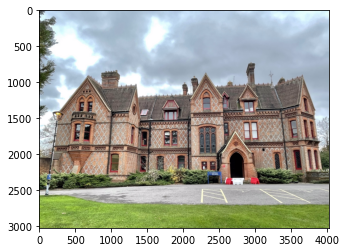

(3024, 4032, 3)


In [ ]:
PATH = "drive/MyDrive/PY/2020_Projects/ImgAnalysis/ImgCompress/2020_images_BMP"
FILE = "IC1.bmp"

img = imread(os.path.join(PATH,FILE))
# img = np.mean(img, axis=-1)
plt.imshow(img)
plt.show()
print(img.shape)

# Define Metrics

In [ ]:
# Mean suqred error (MSE) 
def mse(img_1, img_2):
    return np.sum((img_1-img_2) ** 2)/(img_1.shape[0]*img_1.shape[1])

# root mean-squared error (NRMSE) (0-1), higher the NRMSE, the bigger the difference 
from skimage.metrics import normalized_root_mse
def nrmse(img_1, img_2):
    return normalized_root_mse(img_1, img_2)

#SSIM (0-1), higher the SSIM, higher similarity
from skimage.metrics import structural_similarity
def ssim(img_1, img_2):
    return structural_similarity(img_1, img_2, data_range=img_2.max() - img_2.min(), multichannel=True)

# peak signal to noise ratio (PSNR) higher the PSNR, the higher the similarity. Infinate value refers to the identical images
from skimage.metrics import peak_signal_noise_ratio
def psnr(img_1, img_2):
    return peak_signal_noise_ratio(img_1.astype('uint8'), img_2.astype('uint8'), data_range=None)

def printAll(img_1, img_2): 
# first column is the original value, the second column uses a graylevel scaler on the img_1 only.
# the img_2 is the reference image which is not scaled, since it is the "test set" or "perfect image")
    cols = ['MSE','NRMSE','SSIM','PSNR']
    return pd.DataFrame([[mse(img_1, img_2), nrmse(img_1, img_2), ssim(img_1, img_2), psnr(img_1, img_2)]], columns=cols )
    # print("MSE:", mse(img_1, img_2))
    # print("NRMSE:", nrmse(img_1, img_2))
    # print("SSIM:",ssim(img_1, img_2))
    # print("PSNR:",psnr(img_1, img_2))

In [ ]:
printAll(img,img_recon)

,MSE,NRMSE,SSIM,PSNR
0,60.371991,0.096772,0.909159,24.079707


# Wavelet Test

In [ ]:
def minMaxScaler(X,min=0,max=255):
  X = X.astype("float")
  X_std = (X - X.min()) / (X.max() - X.min())
  X_scaled = X_std * (max - min) + min
  return X_scaled

def waveDecRGB(img, level=2, wavelet='db1'):
  coefs = []
  for c in range(3): # for each RGB channel 
    coefs.append(pywt.wavedec2(img[:,:,c], wavelet=wavelet, level=level)) # use wavelet to decompose
  return coefs

def coefArrRGB(coefs):
  coef_arr, coef_slices = [0,1,2], [0,1,2]
  for c in range(3):
    # Arrange a wavelet coefficient list from wavedecn into a single array
    coef_arr[c], coef_slices[c] = pywt.coeffs_to_array(coefs[c]) 
  return coef_arr, coef_slices


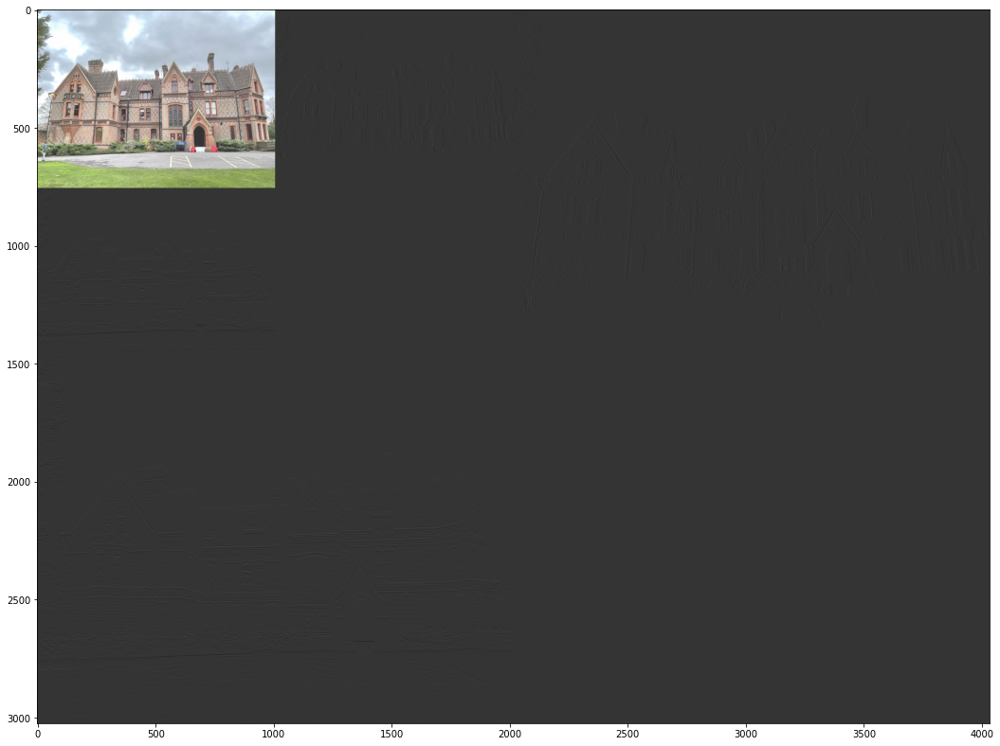

In [ ]:
coefs = waveDecRGB(img)
coef_arr, coef_slices = coefArrRGB(coefs)
coef_arr = [minMaxScaler(l) for l in coef_arr] # scale to 0-255
coef_arr_rgb = np.dstack(coef_arr).astype('uint8') # stack to RGB value
plt.figure(figsize=(18, 16))
plt.imshow(coef_arr_rgb)
plt.show()

DelRate= 0.1
MSE: 269.6808134133283
NRMSE: 0.08684219497307719
SSIM: 0.8654263628843606
PSNR: 25.02012456893226
DelRate= 0.05
MSE: 299.9145962590283
NRMSE: 0.13068106758620535
SSIM: 0.7699268027204699
PSNR: 21.470486931991616
DelRate= 0.01
MSE: 317.0036695523117
NRMSE: 0.17044532294922135
SSIM: 0.6027453969438751
PSNR: 19.163038634704826
DelRate= 0.005
MSE: 291.18112343316955
NRMSE: 0.1494648742205339
SSIM: 0.5408883733923074
PSNR: 20.30395758705627


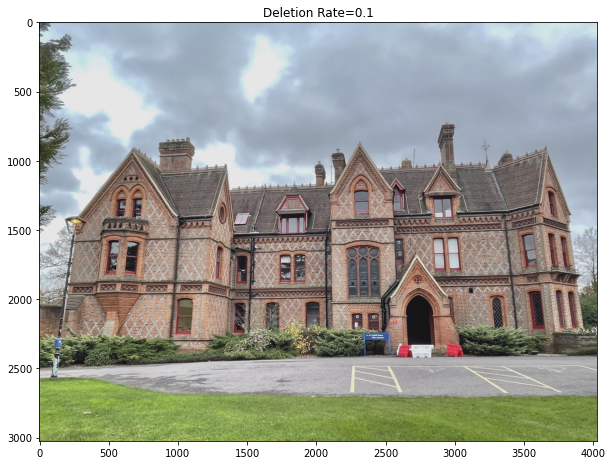

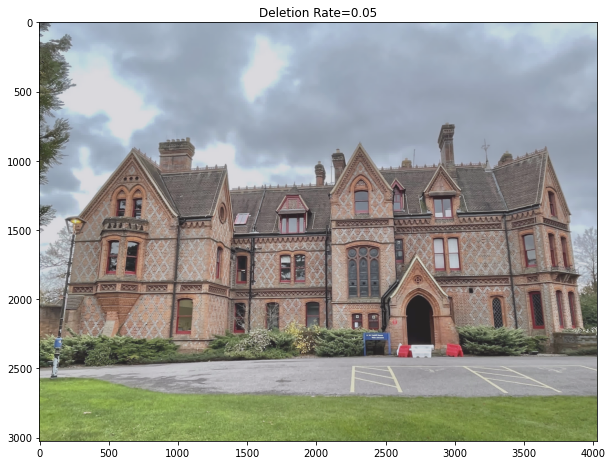

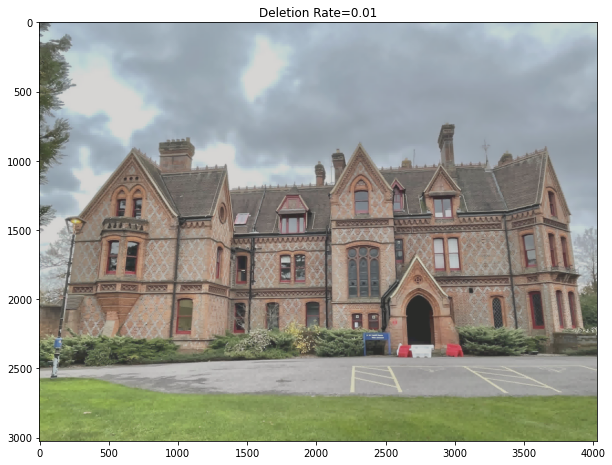

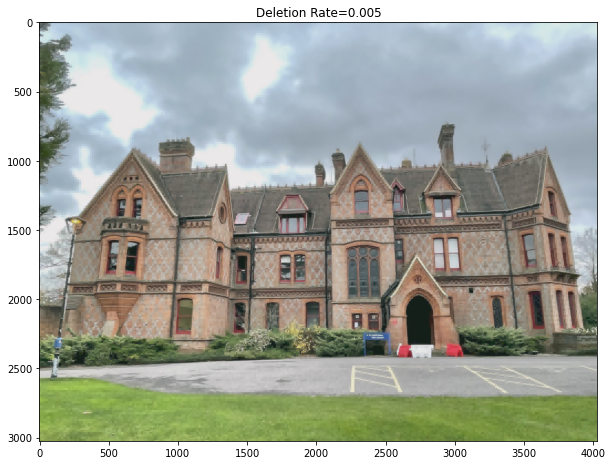

In [ ]:
# use the mean threshold of RGB
coefs = waveDecRGB(img, level=4, wavelet='db1')
coef_arr, coef_slices = coefArrRGB(coefs)
csortRGB = [np.sort(np.abs(coef_arr[c].reshape(-1))) for c in range(3)] # for each channel sort intensity value

for delRate in (0.1, 0.05, 0.01, 0.005):
  thresholdRGB = [csort[int(np.floor((1-delRate)*len(csort)))] for csort in csortRGB] # zero-out threshold for RGB
  # filtered results use the mean threshold of RGB
  arrRGB_masked = coef_arr * (np.abs(np.array(coef_arr)) > np.mean(thresholdRGB))  # coef_arr * (mask)

  dataRGB_compressed = [pywt.array_to_coeffs(arrRGB_masked[c], coef_slices[c], output_format='wavedec2') for c in range(3)]

  img_reconRGB = [pywt.waverec2(channel, wavelet='db1') for channel in dataRGB_compressed]
  img_reconRGB = [minMaxScaler(c) for c in img_reconRGB]
  img_recon = np.dstack(img_reconRGB).astype('uint8')
  print('DelRate=',str(delRate))
  printAll(img, img_recon)
  plt.figure(figsize=(10, 10))
  plt.imshow(img_recon)
  plt.title('Deletion Rate=' + str(delRate))

DelRate= 0.1
MSE: 269.66645908459833
NRMSE: 0.08683971740602367
SSIM: 0.8654380892900365
PSNR: 25.020372376820884
DelRate= 0.05
MSE: 299.9252215739691
NRMSE: 0.13069514455096265
SSIM: 0.7698369702460458
PSNR: 21.469551338339542
DelRate= 0.01
MSE: 317.48137830556607
NRMSE: 0.1703742783346832
SSIM: 0.6024831778960829
PSNR: 19.166659821325965
DelRate= 0.005
MSE: 291.18372940418453
NRMSE: 0.14947590909358532
SSIM: 0.5408646915221246
PSNR: 20.303316338388385


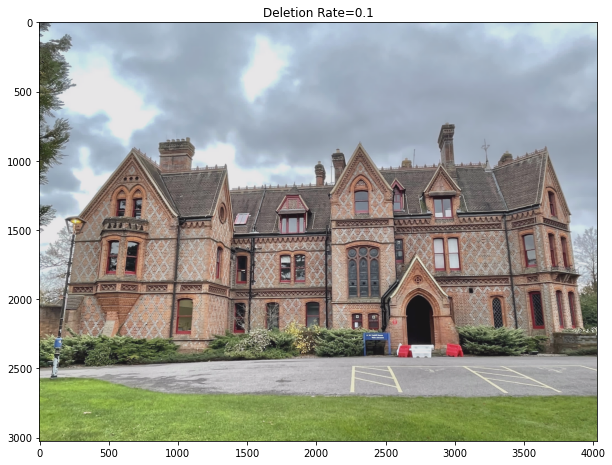

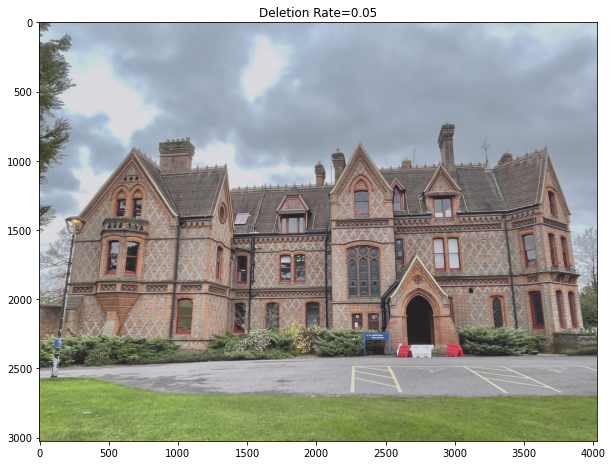

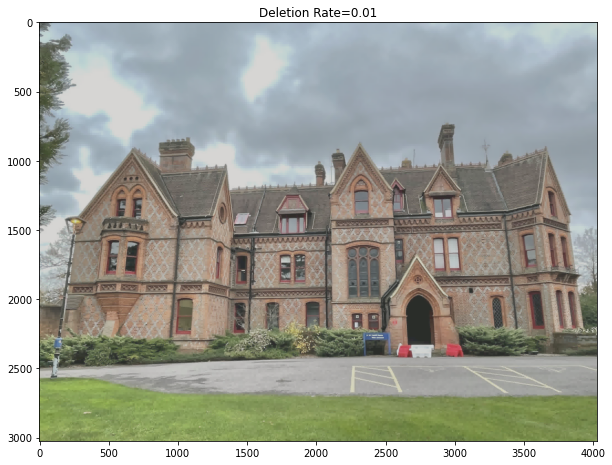

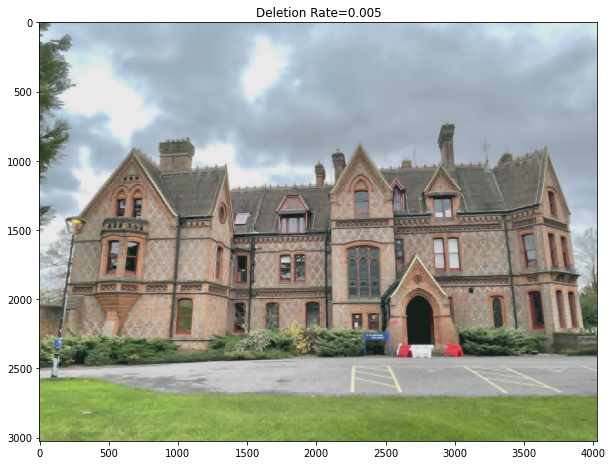

In [ ]:
# Different threshold for each RGB
coefs = waveDecRGB(img, level=4, wavelet='db1')
coef_arr, coef_slices = coefArrRGB(coefs)
csortRGB = [np.sort(np.abs(coef_arr[c].reshape(-1))) for c in range(3)] # for each channel sort intensity value

for delRate in (0.1, 0.05, 0.01, 0.005):
  thresholdRGB = [csort[int(np.floor((1-delRate)*len(csort)))] for csort in csortRGB] # zero-out threshold for RGB
  # thresholdRGB = [np.mean(thresholdRGB)]*3 # only use the min threshold for all RGB channels
  maskRGB = [np.abs(coef_arr[c]) > thresholdRGB[c] for c in range(3)] # build true/false mask for RGB
  arrRGB_masked = [coef_arr[c] * maskRGB[c] for c in range(3)] # filtered results

  dataRGB_compressed = [pywt.array_to_coeffs(arrRGB_masked[c], coef_slices[c], output_format='wavedec2') for c in range(3)]

  img_reconRGB = [pywt.waverec2(channel, wavelet='db1') for channel in dataRGB_compressed]
  img_reconRGB = [minMaxScaler(c) for c in img_reconRGB]
  img_recon = np.dstack(img_reconRGB).astype('uint8')
  print('DelRate=',str(delRate))
  printAll(img, img_recon)
  plt.figure(figsize=(10, 10))
  plt.imshow(img_recon)
  plt.title('Deletion Rate=' + str(delRate))

In [ ]:
len(img_recon.reshape(-1)),os.stat(os.path.join(PATH,FILE)).st_size

(36578304, 36578442)

In [ ]:
# imsave(os.path.join(PATH,'save.bmp'),img_recon,format='bmp')

In [ ]:
import pickle
with open(os.path.join(PATH,"dataRGB_compressed"), 'wb') as handle:
    pickle.dump(dataRGB_compressed, handle, protocol=pickle.HIGHEST_PROTOCOL)


# Wavelet New

In [ ]:
def waveDecRGB(img, level=2, wavelet='db1'):
  coefs = []
  for c in range(3): # for each RGB channel 
    coefs.append(pywt.wavedec2(img[:,:,c], wavelet=wavelet, level=level)) # use wavelet to decompose
  return coefs

def coefArrRGB(coefs):
  coef_arr, coef_slices = [0,1,2], [0,1,2]
  for c in range(3):
    # Arrange a wavelet coefficient list from wavedecn into a single array
    coef_arr[c], coef_slices[c] = pywt.coeffs_to_array(coefs[c]) 
  return coef_arr, coef_slices


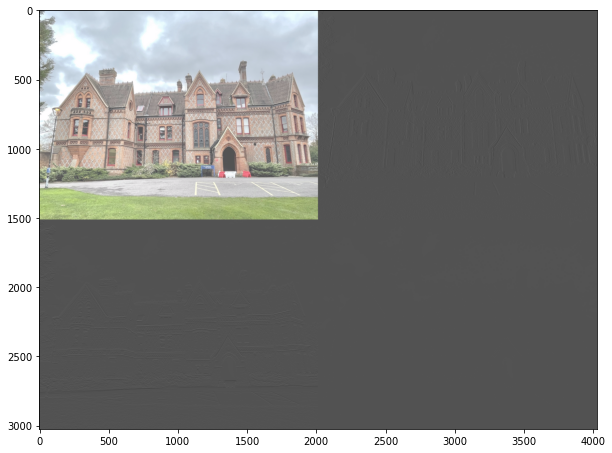

In [ ]:
# show a simple example of Warelet decomposition
coefs = waveDecRGB(img, level=1)
coef_arr, coef_slices = coefArrRGB(coefs)
coef_arr = [minMaxScaler(l) for l in coef_arr] # scale to 0-255
coef_arr_rgb = np.dstack(coef_arr).astype('uint8') # stack to RGB value
plt.figure(figsize=(10, 10))
plt.imshow(coef_arr_rgb)
plt.show()

,MSE,NRMSE,SSIM,PSNR,threshold
0,269.680813,0.086842,0.865426,25.020125,0.100
0,299.914596,0.130681,0.769927,21.470487,0.050
0,315.779133,0.176989,0.654693,18.835828,0.020
0,317.003670,0.170445,0.602745,19.163039,0.010
0,291.181123,0.149465,0.540888,20.303958,0.005


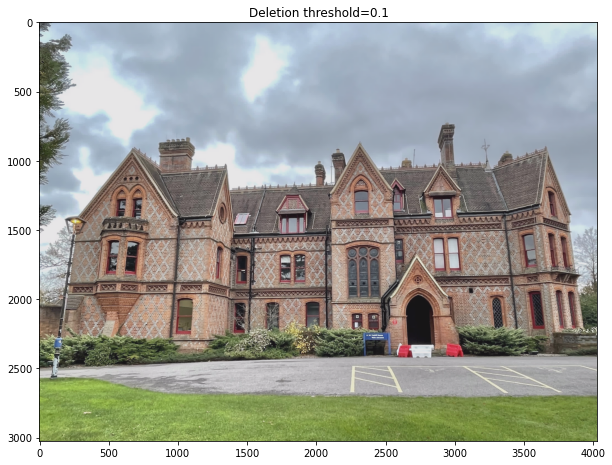

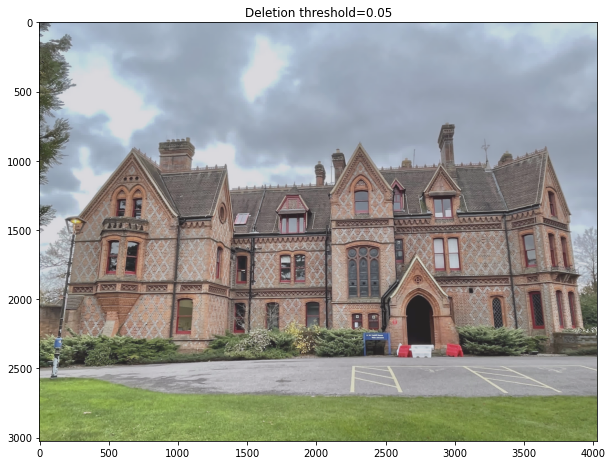

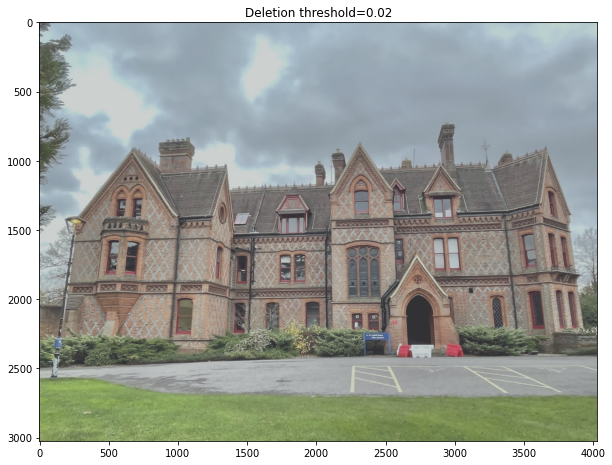

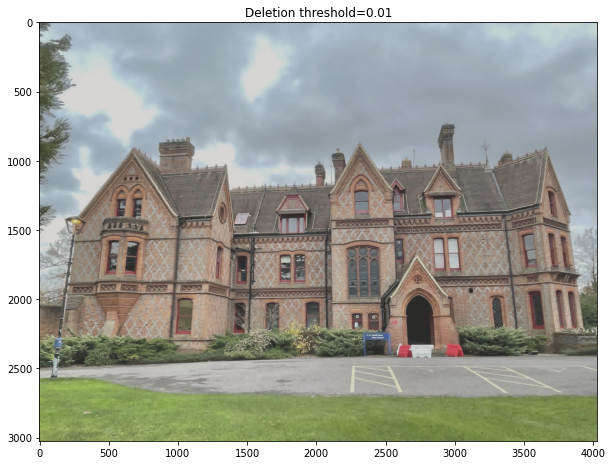

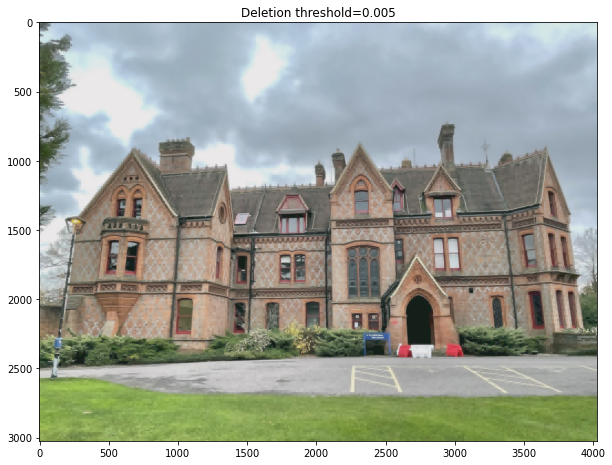

In [ ]:
# use the mean threshold of each channel
def waveCompress(img, thresh=0.01, level=4, wavelet='db1'): # default deletion threshold: 0.01
  coefs = waveDecRGB(img, level, wavelet)
  coef_arr, coef_slices = coefArrRGB(coefs) # coef to array 
  csortRGB = [np.sort(np.abs(coef.reshape(-1))) for coef in coef_arr] # for each channel sort intensity value
  thresholdRGB = [csort[int(np.floor((1-thresh)*len(csort)))] for csort in csortRGB] # zero-out threshold for RGB
  arrRGB_masked = coef_arr * (np.abs(np.array(coef_arr)) > np.mean(thresholdRGB))  # coef_arr * (mask),use the mean threshold of RGB
  dataRGB_compressed = [pywt.array_to_coeffs(arrRGB_masked[c], coef_slices[c], output_format='wavedec2') for c in range(3)]
  # return compressed coefs, and non-zero rate
  return dataRGB_compressed, (np.sum(arrRGB_masked!=0) / (img.shape[0]*img.shape[1]*3))*100

def waveRecon(data, wavelet='db1'):
  img_reconRGB = [pywt.waverec2(channel, wavelet) for channel in dataRGB_compressed]
  img_reconRGB = [minMaxScaler(c) for c in img_reconRGB]
  img_recon = np.dstack(img_reconRGB).astype('uint8')
  return img_recon

df_res_wave = []
for thresh in [0.1, 0.05, 0.01, 0.005, 0.001]: # 10% 5% 1% 0.5% 0.1% 
  dataRGB_compressed, nonZeros = waveCompress(img, thresh, level=4, wavelet='db1')
  nonZero = np.sum(dataRGB_compressed!=0) / (img.shape[0]*img.shape[1]*3)
  img_recon = waveRecon(dataRGB_compressed, wavelet='db1')
  df_res = printAll(img, img_recon)
  df_res.loc[:,'threshold'] = thresh
  df_res.loc[:'nonZeros'] = nonZeros
  df_res_wave.append(df_res)
  plt.figure(figsize=(10, 10))
  plt.imshow(img_recon)
  plt.title('Deletion threshold='+str(thresh))
pd.concat(df_res_wave)

DelRate= 0.1
DelRate= 0.05
DelRate= 0.01
DelRate= 0.005


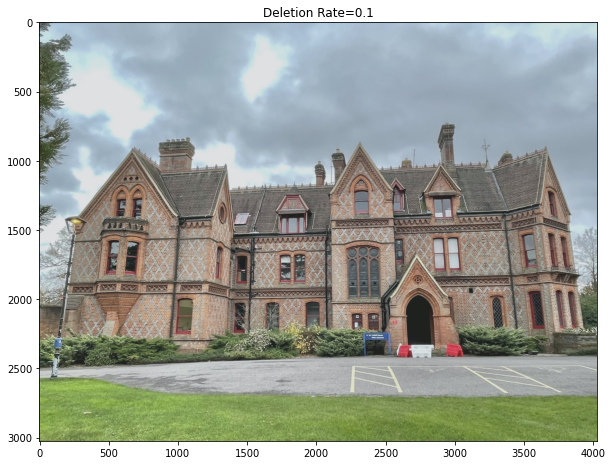

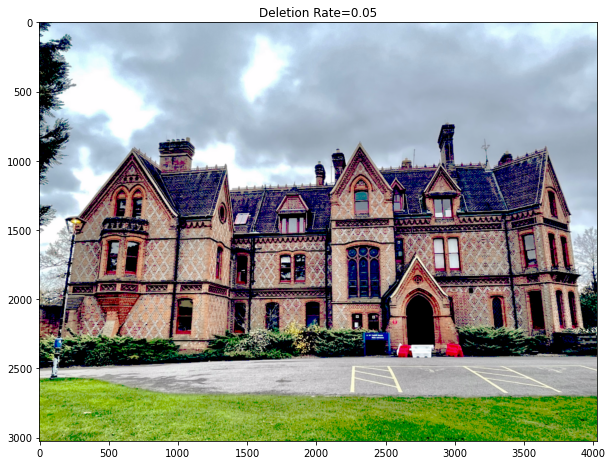

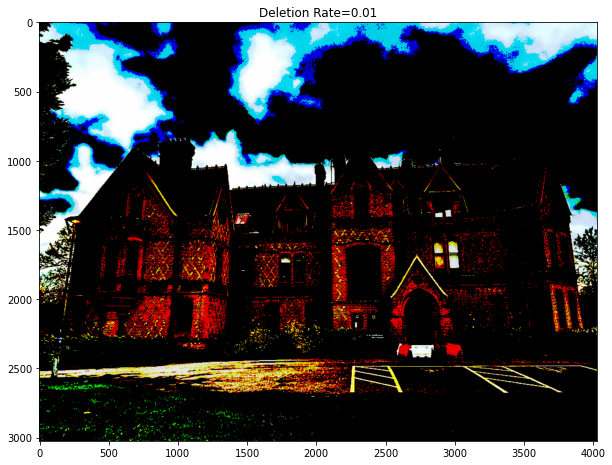

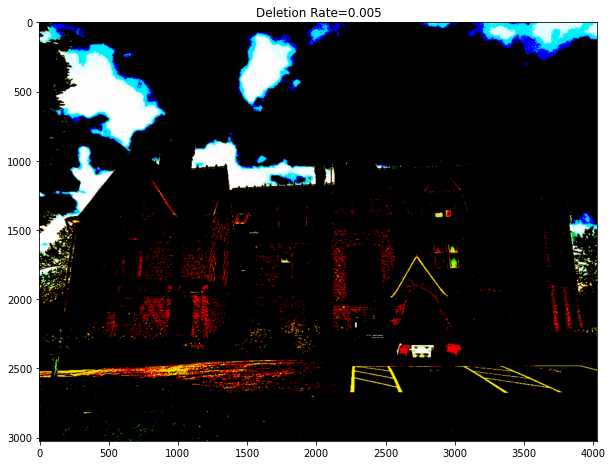

In [ ]:
# Different threshold for each RGB
coefs = waveDecRGB(img, level=2, wavelet='db1')
coef_arr, coef_slices = coefArrRGB(coefs)
csortRGB = [np.sort(np.abs(coef_arr[c].reshape(-1))) for c in range(3)] # for each channel sort intensity value

for delRate in [0.1, 0.05, 0.01, 0.005]:
  thresholdRGB = [csort[int(np.floor((1-delRate)*len(csort)))] for csort in csortRGB] # zero-out threshold for RGB
  # thresholdRGB = [np.mean(thresholdRGB)]*3 # only use the min threshold for all RGB channels
  maskRGB = [np.abs(coef_arr[c]) > thresholdRGB[c] for c in range(3)] # build true/false mask for RGB
  arrRGB_masked = [coef_arr[c] * maskRGB[c] for c in range(3)] # filtered results

  dataRGB_compressed = [pywt.array_to_coeffs(arrRGB_masked[c], coef_slices[c], output_format='wavedec2') for c in range(3)]

  img_reconRGB = [pywt.waverec2(channel, wavelet='db1') for channel in dataRGB_compressed]
  img_reconRGB = [minMaxScaler(c) for c in img_reconRGB]
  img_recon = np.dstack(img_reconRGB).astype('uint8')
  print('DelRate=',str(delRate))
  printAll(img, img_recon)
  plt.figure(figsize=(10, 10))
  plt.imshow(img_recon)
  plt.title('Deletion Rate=' + str(delRate))

# JPEG DCT-based

In [ ]:
# Define 2D DCT and IDCT
from scipy.fftpack import dct, idct
def dct2(img): # default type 2 dft
    return dct(dct(img, axis=0, norm='ortho'), axis=1, norm='ortho' )

def idct2(img):
    return idct(idct(img, axis=0 , norm='ortho'), axis=1 , norm='ortho')

In [ ]:
# code from https://stackoverflow.com/questions/34913005/color-space-mapping-ycbcr-to-rgb
def rgb2ycbcr(im):
    xform = np.array([[.299, .587, .114], [-.1687, -.3313, .5], [.5, -.4187, -.0813]])
    ycbcr = im.dot(xform.T)
    ycbcr[:,:,[1,2]] += 128
    return np.uint8(ycbcr)

def ycbcr2rgb(im):
    xform = np.array([[1, 0, 1.402], [1, -0.34414, -.71414], [1, 1.772, 0]])
    rgb = im.astype(np.float)
    rgb[:,:,[1,2]] -= 128
    rgb = rgb.dot(xform.T)
    np.putmask(rgb, rgb > 255, 255)
    np.putmask(rgb, rgb < 0, 0)
    return np.uint8(rgb)

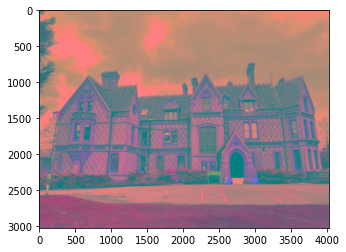

In [ ]:
img_ycbcr = rgb2ycbcr(img)
plt.imshow(img_ycbcr)

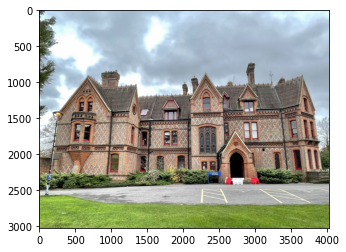

In [ ]:
plt.imshow(ycbcr2rgb(img_ycbcr))

In [ ]:
# Perform a blockwise DCT
def dctBlock(img):
  imsize = img.shape
  dct_img = np.zeros(imsize)

  # 8x8 DCT on image 
  for i in r_[:imsize[0]:8]:
      for j in r_[:imsize[1]:8]:
          dct_img[i:(i+8),j:(j+8)] = dct2(img[i:(i+8),j:(j+8)] )
  return dct_img

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


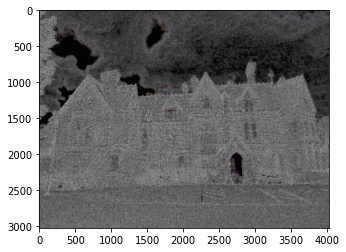

In [ ]:
dct_img = dctBlock(img)
plt.imshow(dct_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


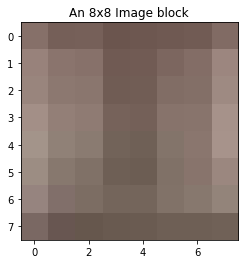

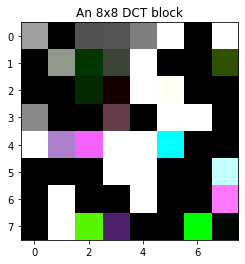

In [ ]:
# Extract 8x8 block and look at its DCT coefficients
pos = 1028

# Extract a sample block from image
plt.figure()
plt.imshow(img[pos:pos+8,pos:pos+8])
plt.title( "An 8x8 Image block")

# Display the dct of that block
plt.figure()
plt.imshow(dct_img[pos:pos+8,pos:pos+8],vmin=0, vmax = np.max(dct_img)*0.01, cmap='gray') # scale down max 
plt.title( "An 8x8 DCT block")
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, '8x8 DCTs of the image')

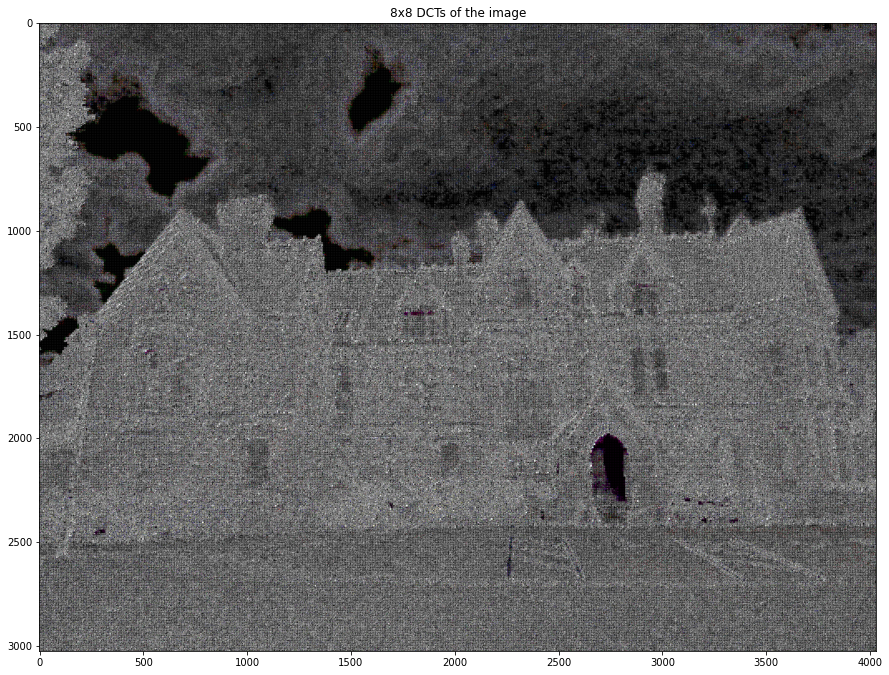

In [ ]:
# Display entire DCT
plt.figure(figsize=(15, 15))
plt.imshow(dct_img,vmax = np.max(dct_img)*0.01,vmin = 0,cmap='gray')
plt.title( "8x8 DCTs of the image")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Keeping only %28.48463121745612 of the DCT coefficients


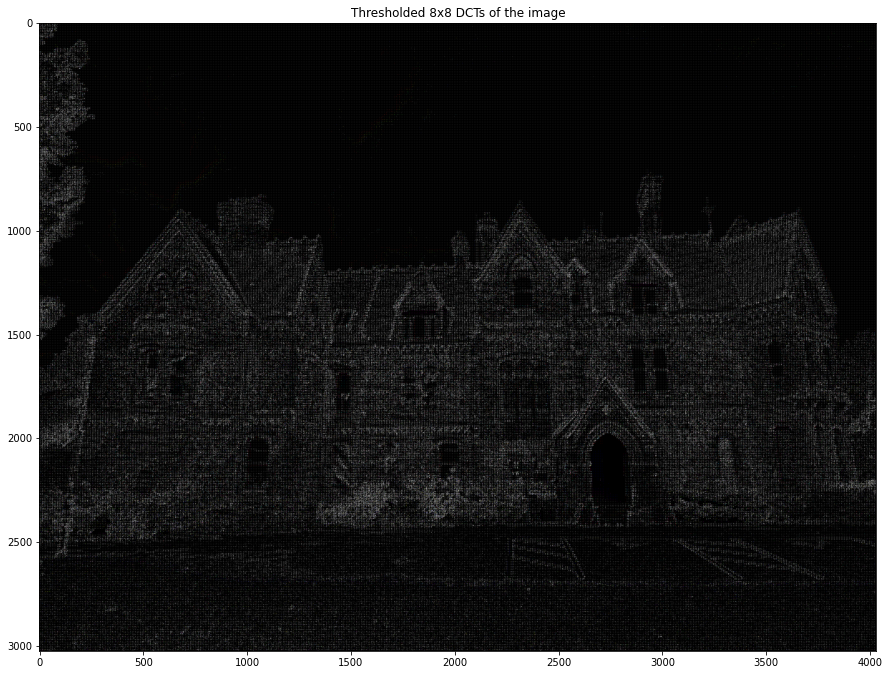

In [ ]:
# Threshold DCT coefficients
def thresholdDCT(dct_blocks,thresh=0.01):
  dct_thresh = dct_blocks * (abs(dct_blocks) > (thresh*np.max(dct_blocks)))  
  return dct_thresh 

dct_thresh = thresholdDCT(dct_img)
# show zero-out dct image
plt.figure(figsize=(15, 15))
plt.imshow(dct_thresh)
plt.title( "Thresholded 8x8 DCTs of the image")

dct_thresh = dct_thresh.astype(int) # covert to integer
percent_nonzeros = np.sum(dct_thresh!=0) / (dct_thresh.shape[0]*dct_thresh.shape[1]*3)
print(f"Keeping only %{(percent_nonzeros*100.0)} of the DCT coefficients")

MSE: 60.37199141327056
NRMSE: 0.09677243016891386
SSIM: 0.9091592564672774
PSNR: 24.0797074613113


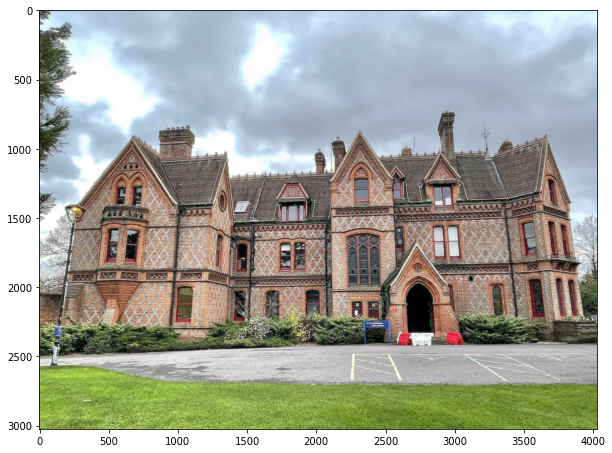

In [ ]:
# Reconstruct image from quantized DCT coefficients
def idctBlock(dct_thresh):
  imsize = img.shape
  img_recon = np.zeros(imsize)
  for i in r_[:imsize[0]:8]:
      for j in r_[:imsize[1]:8]:
          img_recon[i:(i+8),j:(j+8)] = idct2(dct_thresh[i:(i+8),j:(j+8)])
  return img_recon.astype('uint8')

img_recon = idctBlock(dct_thresh)
printAll(img, img_recon)
plt.figure(figsize=(10, 10))
plt.imshow(img_recon)

MSE: 74.9841558536995
NRMSE: 0.07976264975803964
SSIM: 0.9176502748017455
PSNR: 25.758748946094524
Keeping only %12.737058557991098 of the DCT coefficients


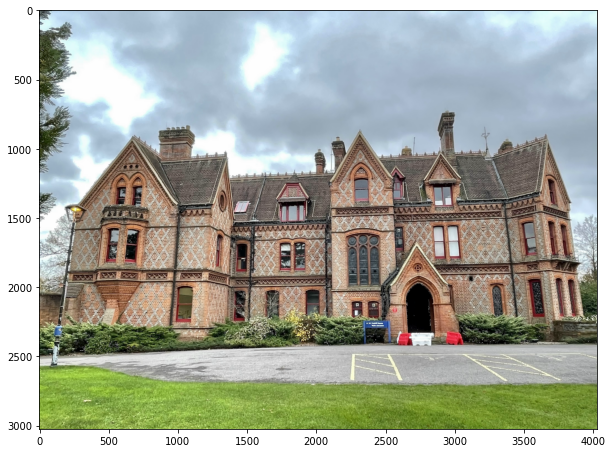

In [ ]:
# YCbCr
img_ycbcr = rgb2ycbcr(img)
dct_img_ycbcr = dctBlock(img_ycbcr)
dct_thresh_ycbcr = thresholdDCT(dct_img_ycbcr,thresh=0.01).astype(int)
img_recon_ycbcr = idctBlock(dct_thresh_ycbcr)
img_recon_ycbcr = ycbcr2rgb(img_recon_ycbcr).astype('uint8')

plt.figure(figsize=(10, 10))
plt.imshow(img_recon_ycbcr)
printAll(img, img_recon_ycbcr)

noZeros = np.sum(dct_thresh_ycbcr!=0) / (dct_thresh_ycbcr.shape[0]*dct_thresh_ycbcr.shape[1]*3)
print(f"Keeping only %{(noZeros*100.0)} of the DCT coefficients")


# Encoding Compression



In [ ]:
# adapt from https://github.com/getsanjeev/compression-DCT/blob/master/zigzag.py
def zigzag(input):
    h,v = 0,0 # current position
    # image shape
    vmin, hmin = 0,0
    vmax, hmax = input.shape[:2]
    i = 0 # index
    output = np.zeros(( vmax * hmax)) # all pixels
    while ((v < vmax) and (h < hmax)): # while not reaching the end
        if ((h + v) % 2) == 0:  # even shape, going up
            if (v == vmin):
                output[i] = input[v, h]   # if we got to the first line
                if (h == hmax):
                    v+=1 # go down
                else:
                    h+=1  # go right               
                i+=1
            elif ((h == hmax-1 ) and (v < vmax)):   # if we got to the last column
            	output[i] = input[v, h] 
            	v+=1
            	i+=1
            elif ((v > vmin) and (h < hmax -1 )):   # all other cases
            	output[i] = input[v, h] 
            	v-=1
            	h+=1
            	i+=1
        else:                                    # odd shape, going down
        	if ((v == vmax -1) and (h <= hmax -1)): # if we got to the last line
        		output[i] = input[v, h] 
        		h+=1
        		i+=1
        	elif (h == hmin):                  # if we got to the first column
        		output[i] = input[v, h] 
        		if (v == vmax -1):
        			h+=1
        		else:
        			v+=1
        		i+=1
        	elif ((v < vmax -1) and (h > hmin)):     # all other cases
        		output[i] = input[v, h] 
        		v+=1
        		h-=1
        		i+=1
        if ((v == vmax-1) and (h == hmax-1)):          # bottom right element
        	output[i] = input[v, h] 
        	break
    #print ('v:',v,', h:',h,', i:',i)
    return output
def inverse_zigzag(input, vmax, hmax):
	h,v = 0,0 # current position
	# image shape
	vmin, hmin = 0,0
	output = np.zeros((vmax, hmax))
	i = 0
	while ((v < vmax) and (h < hmax)): 
		if ((h + v) % 2) == 0:                 # going up
			if (v == vmin):
				output[v, h] = input[i]        # if we got to the first line
				if (h == hmax):
					v+=1
				else:
					h+=1                        
				i+=1
			elif ((h == hmax -1 ) and (v < vmax)):   # if we got to the last column
				output[v, h] = input[i] 
				v+=1
				i+=1
			elif ((v > vmin) and (h < hmax -1 )):    # all other cases
				output[v, h] = input[i] 
				v-=1
				h+=1
				i+=1
		else:                                    # going down
			if ((v == vmax -1) and (h <= hmax -1)):       # if we got to the last line
				output[v, h] = input[i] 
				h+=1
				i+=1
			elif (h == hmin):                  # if we got to the first column
				output[v, h] = input[i] 
				if (v == vmax -1):
					h+=1
				else:
					v+=1
				i+=1
			elif((v < vmax -1) and (h > hmin)):     # all other cases
				output[v, h] = input[i] 
				v+=1
				h-=1
				i+=1
		if ((v == vmax-1) and (h == hmax-1)):          # bottom right element
			output[v, h] = input[i] 
			break
	return output

def zigzag3D(input):
  bitlist=[]
  for c in range(3):
    bitlist.extend(zigzag(input[:,:,c]))
  return np.array(bitlist).astype(int)

def i_zigzag3D(input, vmax, hmax):
  list_3d = np.array(input).reshape(3,-1)
  i_zigzags = []
  for c in range(3):
    i_zigzags.append(inverse_zigzag(list_3d[c], vmax, hmax))
  return np.dstack(i_zigzags)

In [ ]:
temp = np.array([[[ 749,  815,  801],
        [ -46,  -35,  -39],
        [  71,   68,   69],
        [   0,    0,    0]],

       [[ 132,  142,  139],
        [-119, -112, -115],
        [   0,    0,    0],
        [  24,   24,   24]],

       [[  42,   39,   40],
        [ 170,  169,  169],
        [   0,    0,    0],
        [   0,    0,    0]]])
temp.shape

(3, 4, 3)

In [ ]:
z3d = zigzag3D(temp)
pd.Series((temp == i_zigzag3D(z3d,3,4)).flatten()).value_counts()

True    36
dtype: int64

In [ ]:
z = zigzag(temp)
z1 = inverse_zigzag(z,3024, 4032)
pd.Series((temp == z1).flatten()).value_counts()

True    12192768
dtype: int64

In [ ]:
def get_run_length_encoding(data): # input - np.array(zzCode).astype(int)
  encoding = ['']
  data = data.tolist()
  # while len(data)>0:
  #   e = data.pop(0)
  for e in tqdm(data):
    if e != 0:
      encoding.append(e)
    else:
      if (encoding[-1]=='X'): # if there is already a 0/X
        encoding[-1] = 'X2' # change the last encoding to X2 
      elif (not isinstance(encoding[-1],int)) and (len(encoding[-1]) > 1): # 
        encoding[-1] = 'X'+str(int(encoding[-1][1:]) + int(1))
      else:
        encoding.append('X')
  encoding = list(map(str, encoding))
  return ' '.join(encoding)[1:]

In [ ]:
def inverse_encoding(strs):
  codes = strs.split()
  data = []
  # while len(codes)>0:
  #   e = codes.pop(0)
  for e in tqdm(codes):
    if e[0] != 'X':
      data.append(int(e))
    elif e=='X':
      data.append(0)
    else:
      data.extend(np.zeros(int(e[1:])))
  return data

In [ ]:
s = [1,0,0,0,0.00,0,0,00,0,0,0,0,0,1,10,0,749,  -46,  132,   0, 0,   0,    0,    0,  170,    0,   24,
          0,  815,  -35,  142,   39, -112,   68,    0,    0,  169,    0,
         24,    0,  801,  -39,  139,   40, -115,   69,    0,    0,  169,
          0,   24,    0]
s = np.array(s).astype(int)

In [ ]:
l = get_run_length_encoding(s)
i_code = inverse_encoding(l)
i_code == s


100%|██████████| 52/52 [00:00<00:00, 221200.62it/s]

100%|██████████| 35/35 [00:00<00:00, 25950.26it/s]


array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True])

In [ ]:
zzCode = zigzag3D(dct_thresh)
runLenCode = get_run_length_encoding(zzCode)


100%|██████████| 36578304/36578304 [00:37<00:00, 971569.47it/s]


In [ ]:
dct_thresh.shape[0]*dct_thresh.shape[1]*3

36578304

In [ ]:
(len(runLenCode)/36578304)*100

56.67831947593852

In [ ]:
text_file = open(os.path.join(PATH,"DCT_0.1_RGB_runLenCode"), "w")
text_file.write(runLenCode)
text_file.close()

In [ ]:
reconCode = inverse_encoding(runLenCode)
reconDct = i_zigzag3D(reconCode, dct_thresh.shape[0],dct_thresh.shape[1])


100%|██████████| 5940191/5940191 [00:10<00:00, 578007.39it/s]


In [ ]:
pd.Series((reconDct==dct_thresh).flatten()).value_counts()

True    36578304
dtype: int64